In [1]:
import scvelo as scv
import numpy as np
import pandas as pd
import scanpy as sc
import loompy
import matplotlib as mpl
import matplotlib.pyplot as pl

import collections.abc
#cellrank needs the following alias to be done manually.
collections.Iterable = collections.abc.Iterable
import cellrank as cr
from scipy.stats import mode
from collections import Counter
from matplotlib import rcParams
#import diffxpy as de
#import palantir
import seaborn
import warnings
import scanpy.external as sce

In [2]:
#settings
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(color_map='viridis')
sc.settings.set_figure_params(dpi=80, facecolor='white')
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==2.0.1 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


In [3]:
#results file
results_file = 'Users/renevielman/OneDrive - Creighton University/Creighton/scRNAseq/Scanpy/Cocktail_cytotrace.h5ad'  # the file that will store the analysis results

In [4]:
#read h5 OR h5ac
adata = sc.read_10x_h5(filename = 'C:/Users/rvi33352/Documents/Sox2TdT_C18A2CE/cocktail/Cocktail_filtered_feature_bc_matrix.h5')
#adata = sc.read_h5ad(filename = '/Users/renevielman/OneDrive - Creighton University/Creighton/scRNAseq/Scanpy/Conversion.h5ad')
adata

reading C:/Users/rvi33352/Documents/Sox2TdT_C18A2CE/cocktail/Cocktail_filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 14849 × 32287
    var: 'gene_ids', 'feature_types', 'genome'

In [5]:
#read loom file, merge
ldata = scv.read('C:/Users/rvi33352/Documents/Sox2TdT_C18A2CE/L_Sox2Cre-TdT_treated.loom', cache=True)
scv.utils.clean_obs_names(adata)
scv.utils.clean_obs_names(ldata)
adata = scv.utils.merge(adata, ldata)

... reading from cache file cache\C-Users-rvi33352-Documents-Sox2TdT_C18A2CE-L_Sox2Cre-TdT_treated.h5ad


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [6]:
adata.var_names_make_unique()

In [7]:
adata

AnnData object with n_obs × n_vars = 14849 × 21081
    obs: 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

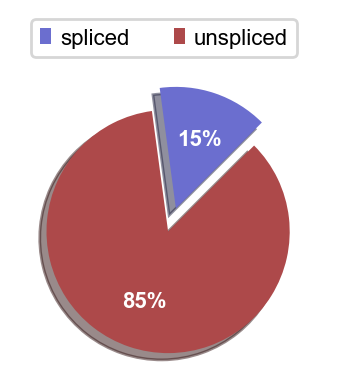

In [8]:
scv.pl.proportions(adata)

normalizing counts per cell
    finished (0:00:00)


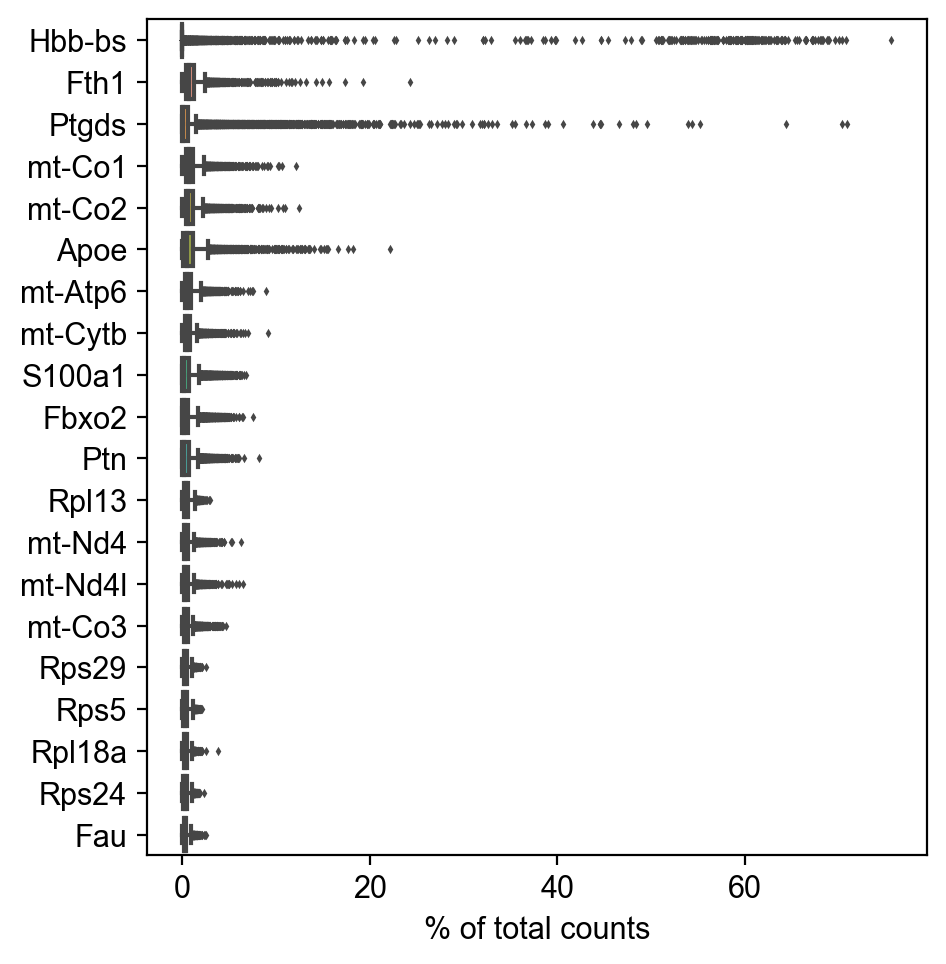

In [9]:
#highest expressed genes
sc.pl.highest_expr_genes(adata, n_top=20, )

filtered out 182 cells that have less than 200 genes expressed
filtered out 5302 genes that are detected in less than 3 cells


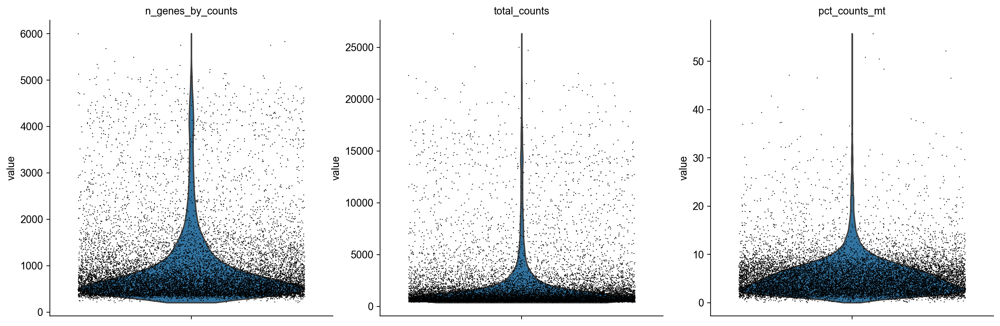

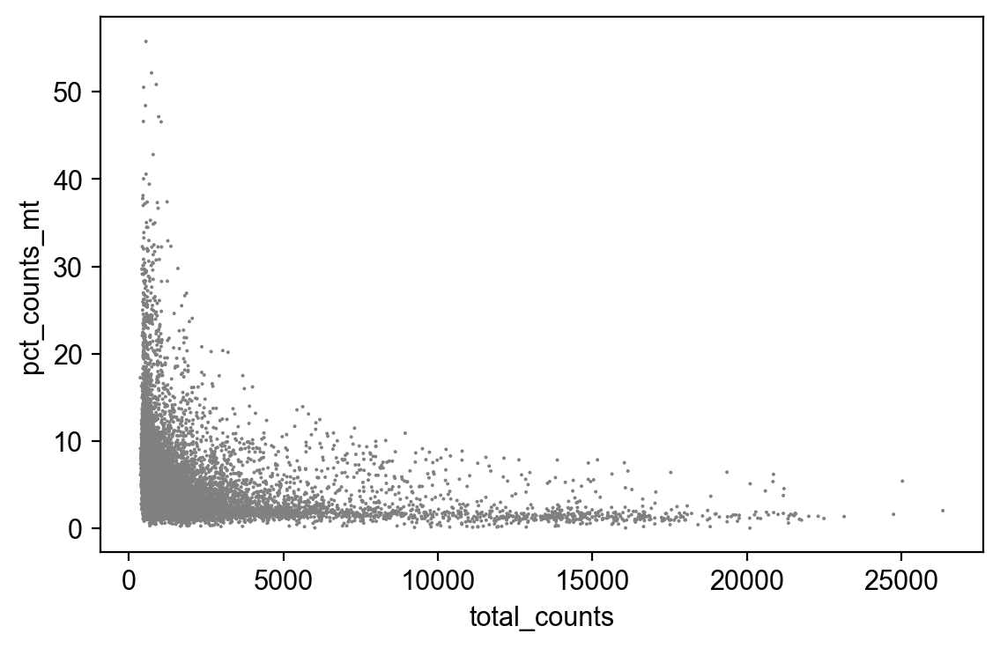

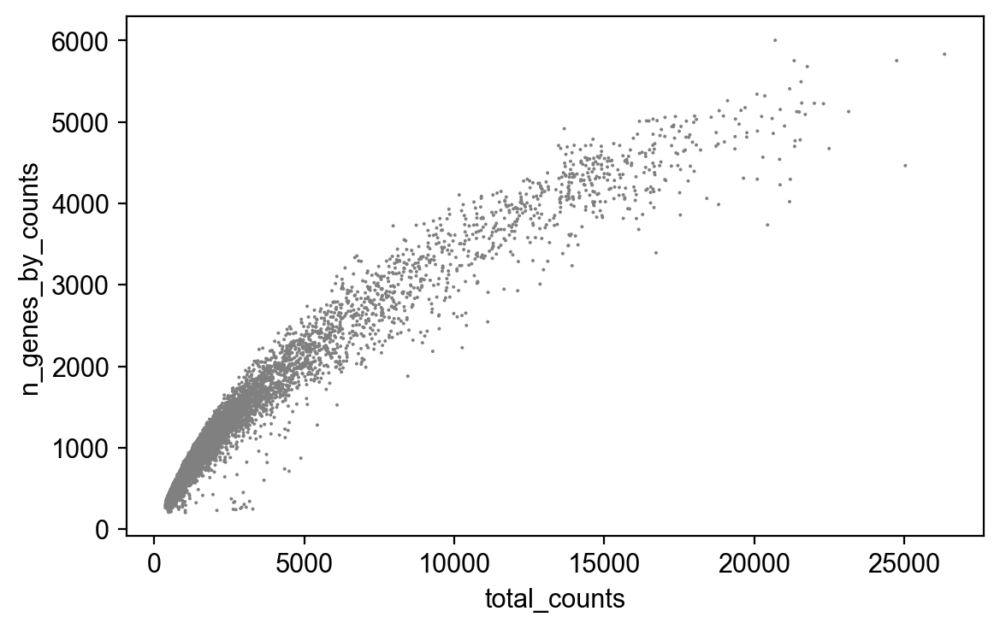

normalizing counts per cell
    finished (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [10]:
#filtering and normalization
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.var['mt'] = adata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

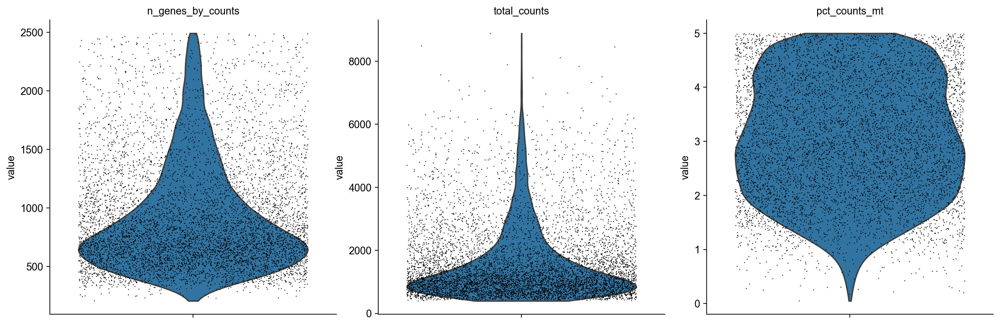

In [11]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


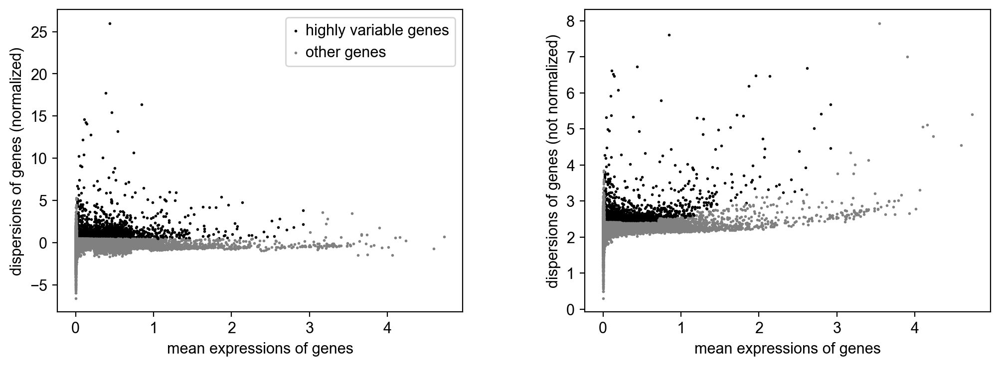

In [12]:
#identify highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

In [13]:
adata

AnnData object with n_obs × n_vars = 7341 × 15779
    obs: 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [14]:
#set raw data
adata.raw = adata

In [15]:
#filtering, regression and scaling
adata = adata[:, adata.var.highly_variable]

In [16]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:13)


In [17]:
sc.pp.scale(adata, max_value=10)

In [18]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:01)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [19]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


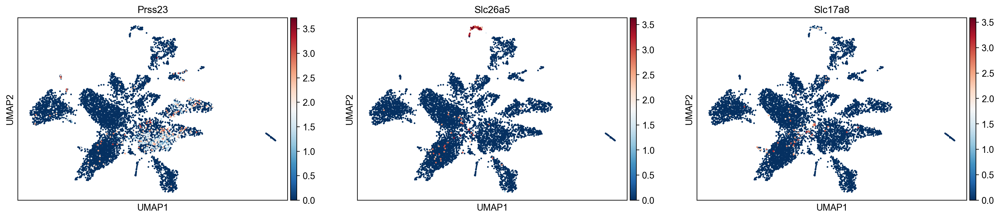

In [20]:
sc.tl.umap(adata) 
sc.pl.umap(adata, color=['Prss23', 'Slc26a5', 'Slc17a8']) 

In [21]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


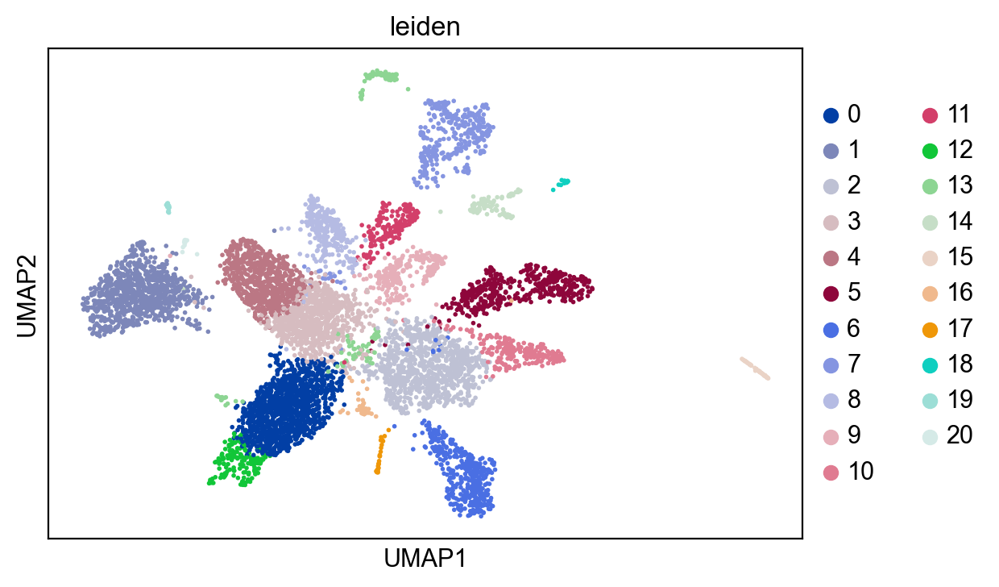

In [22]:
sc.pl.umap(adata, color = 'leiden')

In [23]:
marker_genes = ["Sox2", "Sox9", "Sox10", "Lfng", "Cdkn1b", "Gjb2", "Prss23", "S100a6", 
                "S100a1", "Slc1a3", "Fst", "Fabp7", "Fgfr3", "Lgr5", "Gata3", "Spry2", "Myo6", 
                "Myo7a", "Slc26a5", "Slc17a8", "Otof", "Ocm", "Pvalb", "Calb2", "Ikzf2",
               "Tbx2", "Pou4f3", "Pcp4", "Espn", "Isl1", "Nefh", "Thy1", "Tubb3", "Cldn11", 
               "Met", "Dct", "Coch", "Emilin2", "Kcnq1", "Cx3cr1", "Cd3g", "Cd4", "Mpz", 
                  "Mbp", "Plp1", "Slc26a4", "Vmo1", "Itgam", "Cd79a", "Hba-a1", "Hba-a2"]

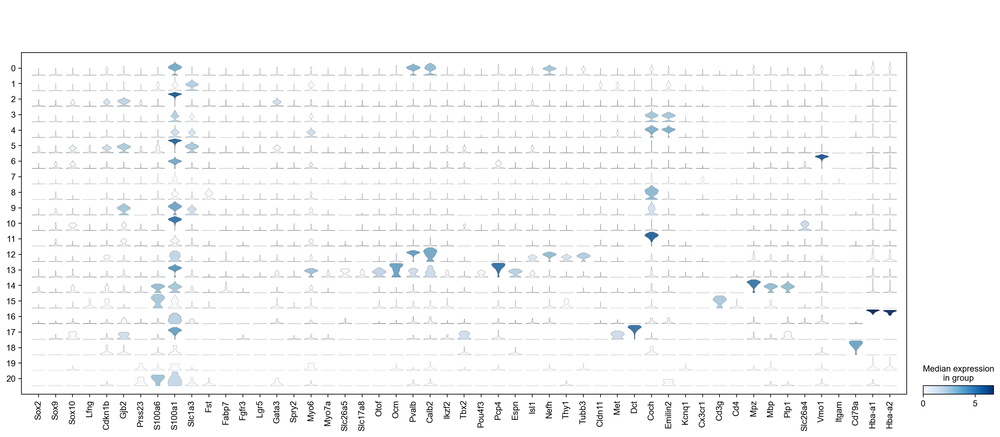

In [24]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90);

In [25]:
new_cluster_names = ['SGN1', 'Basal cells', 'SC1', 'TBC1', 'TBC2', 'SC2', 'RM', 'MP',
                    'Spiral Lig1', 'Spiral Lig2', 'Spindle/Root Cell', 'Spiral Lim', 'SGN2', 'HC-cHC', 
                    'Schwann', 'T-cells', 'Hb+', 'Intermediate cells', 'B-cells', 'Marginal cells', '??']
adata.rename_categories('leiden', new_cluster_names)

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


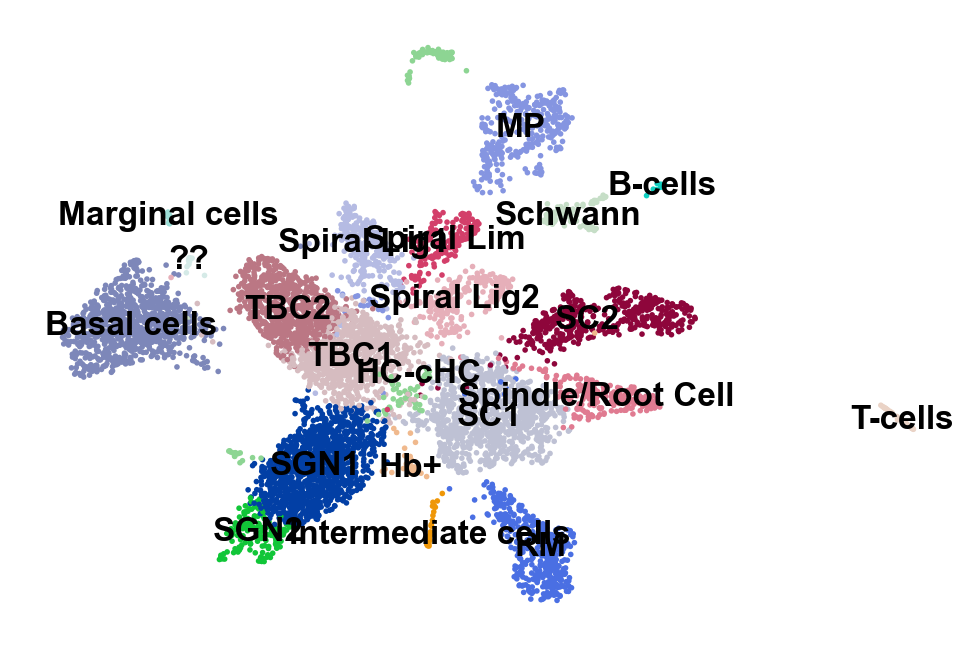

In [26]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


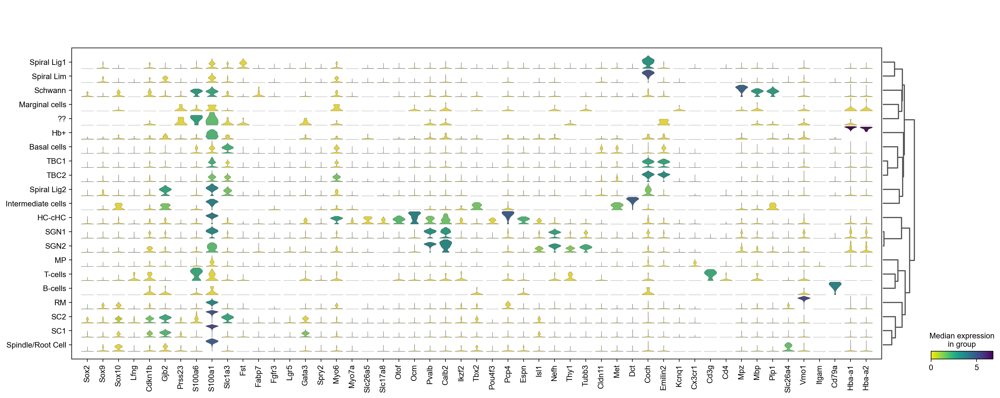

In [27]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90, dendrogram=True,
                      cmap='viridis_r');

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)
C:\Users\rvi33352\AppData\Local\Programs\Python\Pyth

--> added 'pos', the PAGA positions (adata.uns['paga'])


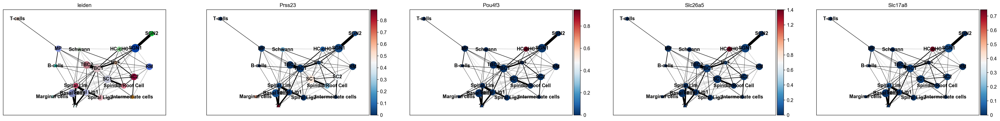

--> added 'pos', the PAGA positions (adata.uns['paga'])


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


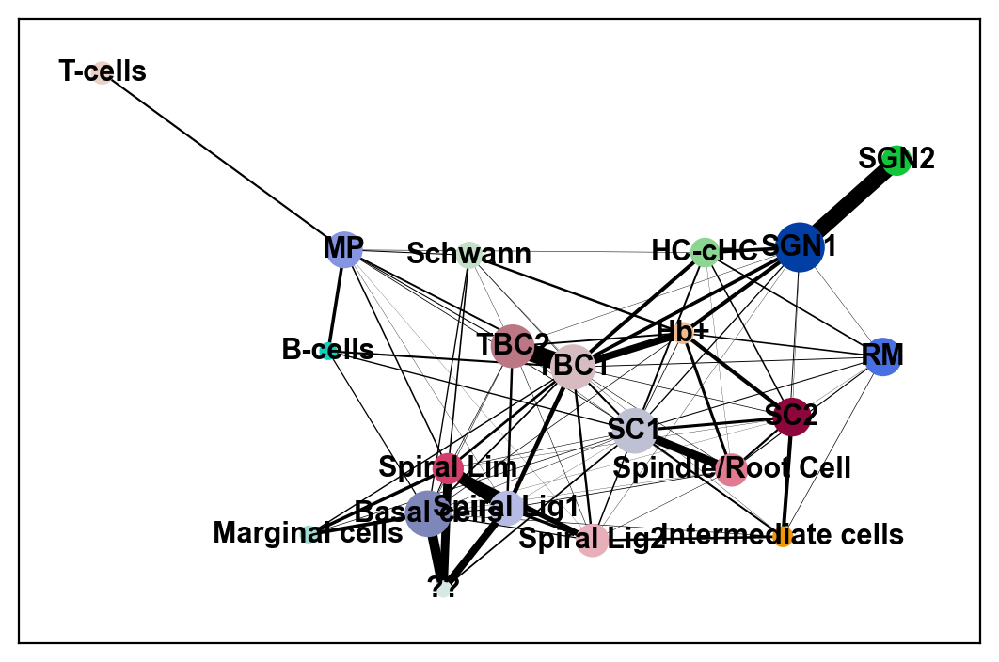

In [28]:
#PAGA
sc.tl.paga(adata, groups='leiden')
sc.pl.paga(adata, color=['leiden', 'Prss23', 'Pou4f3', 'Slc26a5', 'Slc17a8'])
sc.pl.paga(adata, color=['leiden'])

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


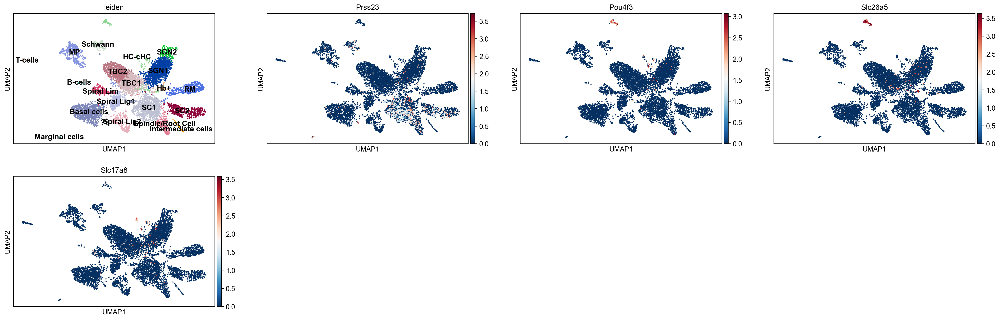

In [29]:
sc.tl.umap(adata, init_pos='paga')
sc.pl.umap(adata, color=['leiden', 'Prss23', 'Pou4f3', 'Slc26a5', 'Slc17a8'], 
          legend_loc='on data')

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


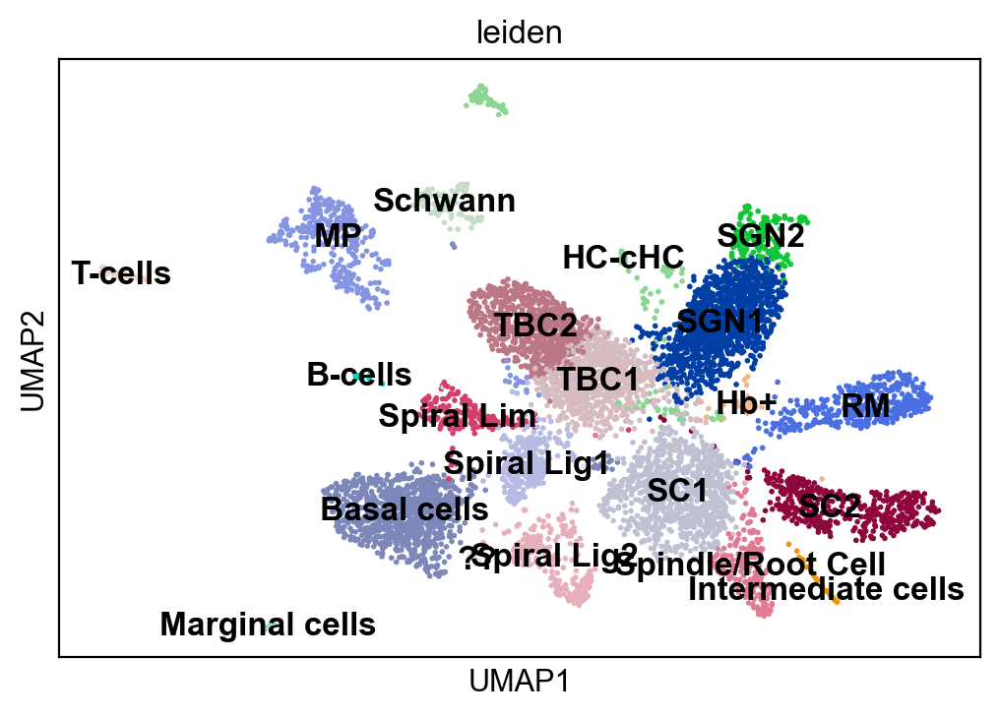

In [30]:
sc.pl.umap(adata, color='leiden', legend_loc='on data')

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


--> added 'pos', the PAGA positions (adata.uns['paga'])


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


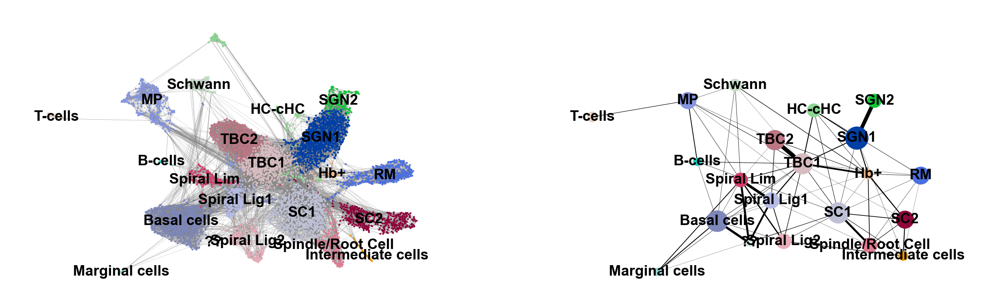

In [31]:
sc.pl.paga_compare(
    adata, threshold=0.03, title='', right_margin=0.2, size=10, edge_width_scale=0.5,
    legend_fontsize=12, fontsize=12, frameon=False, edges=True, save=True)

In [32]:
#subset SC, cHC, HC
adata_subset = adata[adata.obs['leiden'].isin(['HC-cHC', 'SC1', 'SC2'])]

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


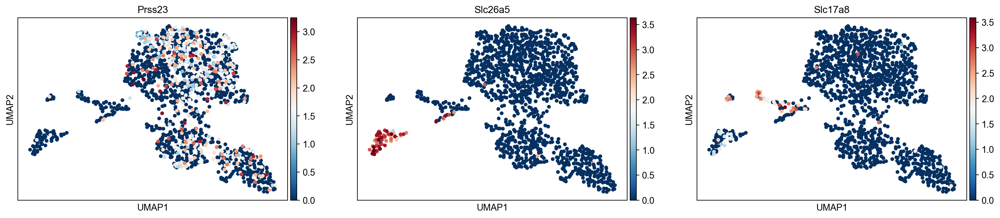

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


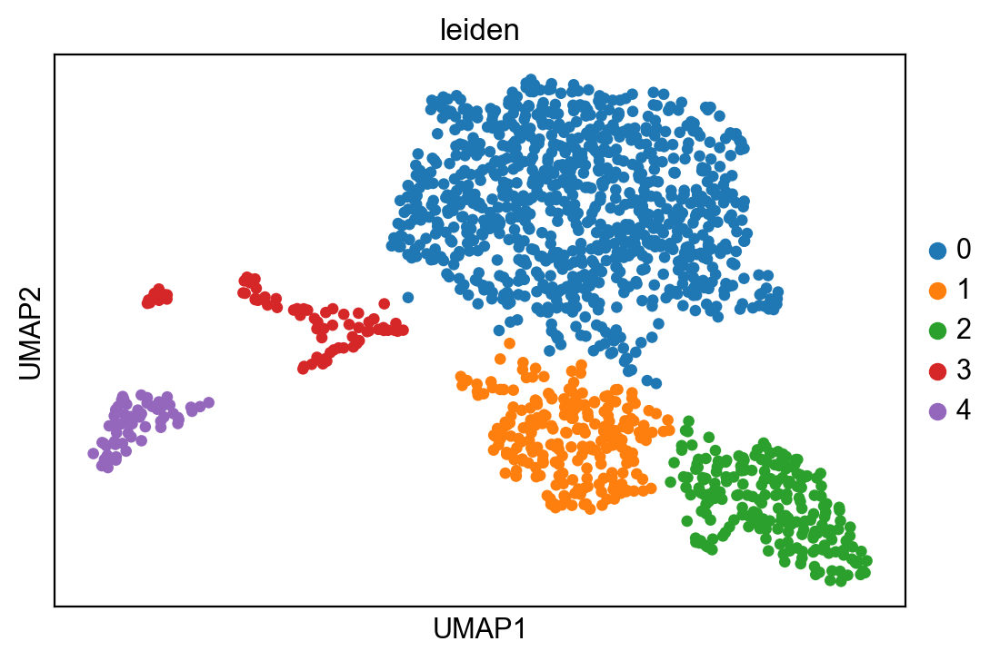

In [33]:
sc.pp.neighbors(adata_subset, n_neighbors=10, n_pcs=20)
sc.tl.pca(adata_subset, svd_solver='arpack')
sc.tl.umap(adata_subset) 
sc.pl.umap(adata_subset, color=['Prss23', 'Slc26a5', 'Slc17a8']) 
sc.tl.leiden(adata_subset, resolution = 0.2)
sc.pl.umap(adata_subset, color = 'leiden')

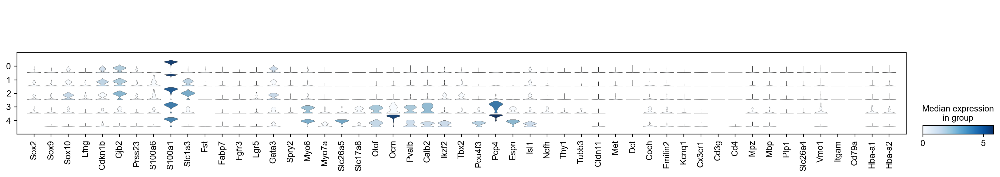

In [34]:
sc.pl.stacked_violin(adata_subset, marker_genes, groupby='leiden', rotation=90);

running Leiden clustering
    finished: found 9 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


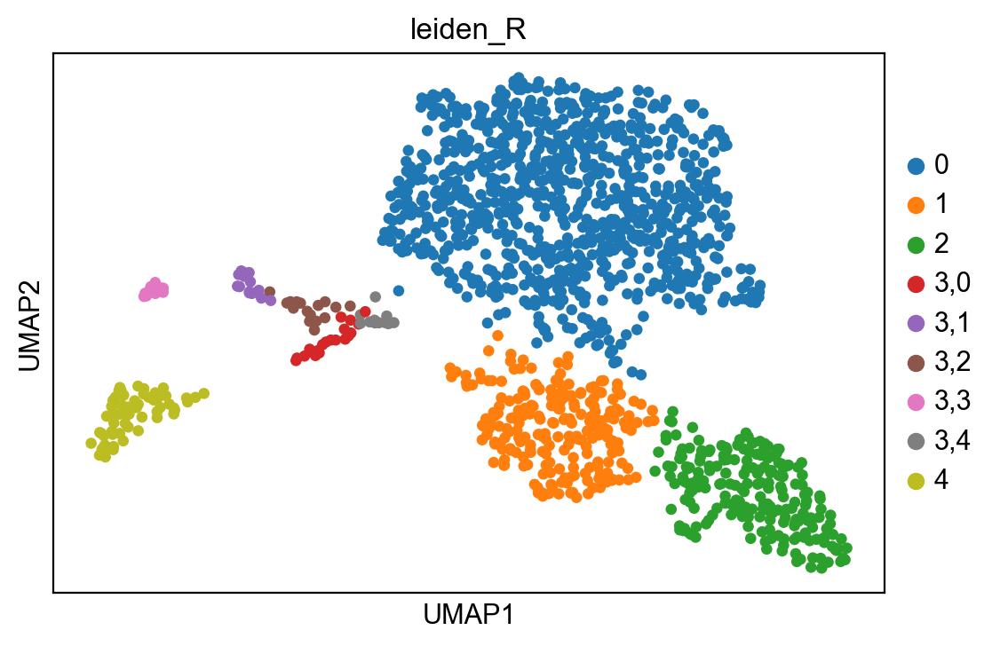

In [35]:
sc.tl.leiden(adata_subset, resolution = 0.4, restrict_to=('leiden', ['3']))
sc.pl.umap(adata_subset, color = 'leiden_R')

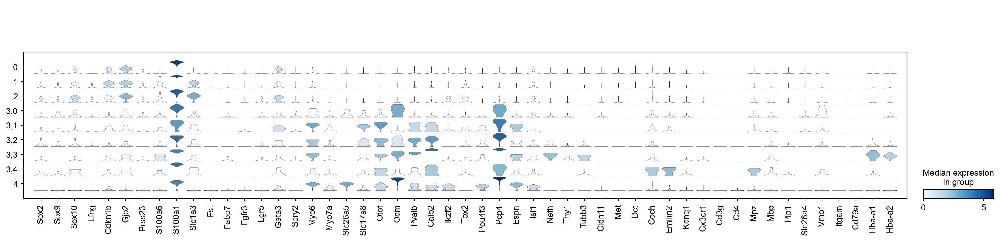

In [36]:
sc.pl.stacked_violin(adata_subset, marker_genes, groupby='leiden_R', rotation=90);

In [37]:
adata_subset.obs["leiden_R"].value_counts()

leiden_R
0      882
1      226
2      208
4       62
3,0     19
3,1     17
3,2     16
3,3     14
3,4     11
Name: count, dtype: int64

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


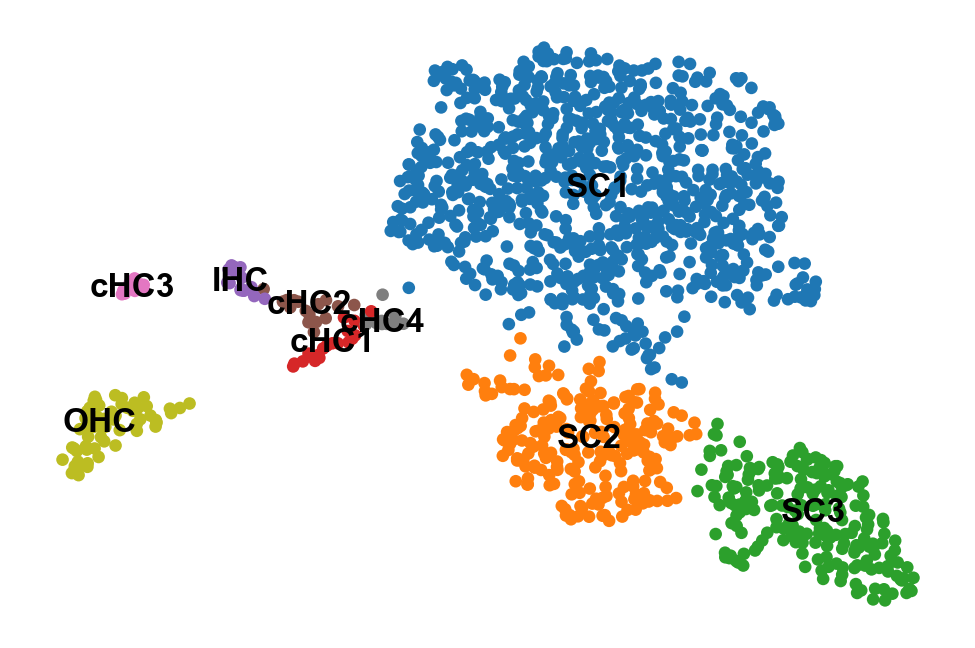

In [38]:
renamed_subclusters = ['SC1', 'SC2', 'SC3', 'cHC1', 'IHC', 'cHC2', 'cHC3', 'cHC4', 'OHC']
adata_subset.rename_categories('leiden_R', renamed_subclusters)
sc.pl.umap(adata_subset, color='leiden_R', legend_loc='on data', title='', frameon=False, save='.pdf')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_R']`


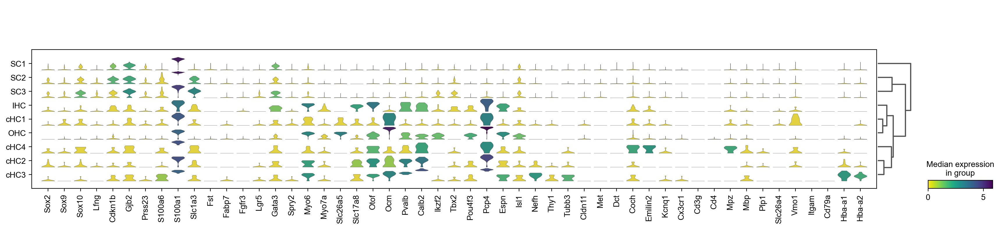

In [39]:
sc.tl.dendrogram(adata_subset, groupby='leiden_R')
sc.pl.stacked_violin(adata_subset, marker_genes, groupby='leiden_R', rotation=90, dendrogram=True,
                      cmap='viridis_r');

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)
C:\Users\rvi33352\AppData\Local\Programs\Python\Pyth

--> added 'pos', the PAGA positions (adata.uns['paga'])


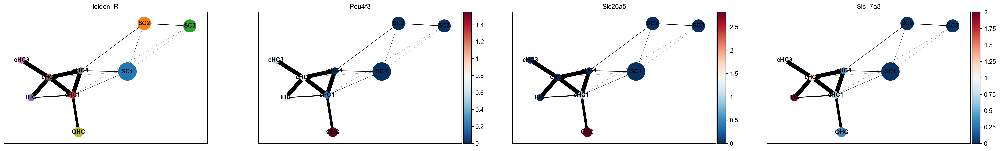

--> added 'pos', the PAGA positions (adata.uns['paga'])


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


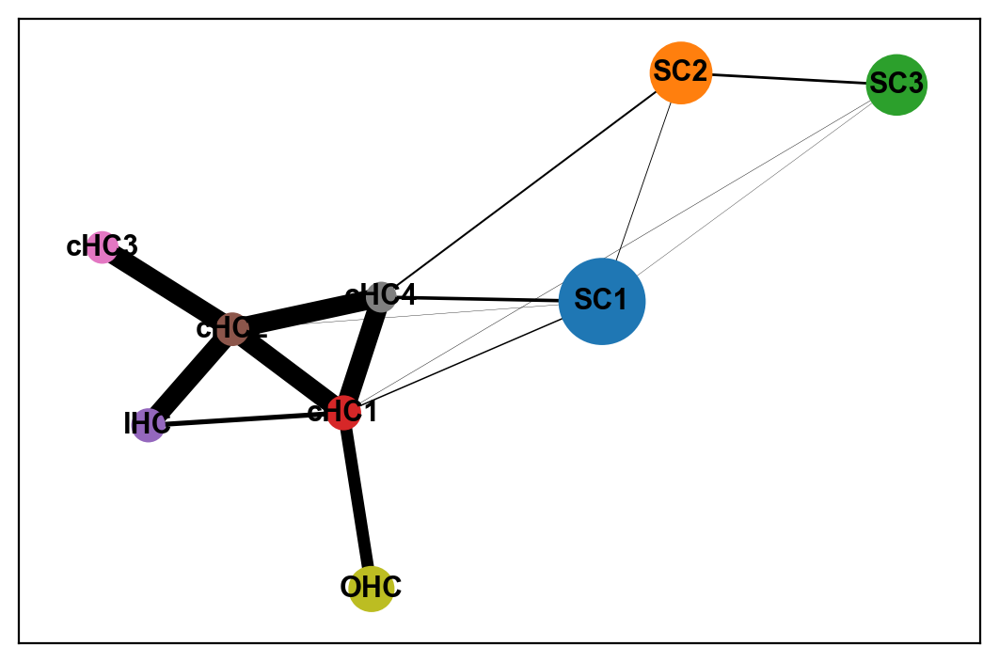

In [40]:
#PAGA
sc.tl.paga(adata_subset, groups='leiden_R')
sc.pl.paga(adata_subset, color=['leiden_R', 'Pou4f3', 'Slc26a5', 'Slc17a8'])
sc.pl.paga(adata_subset, color=['leiden_R'])

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


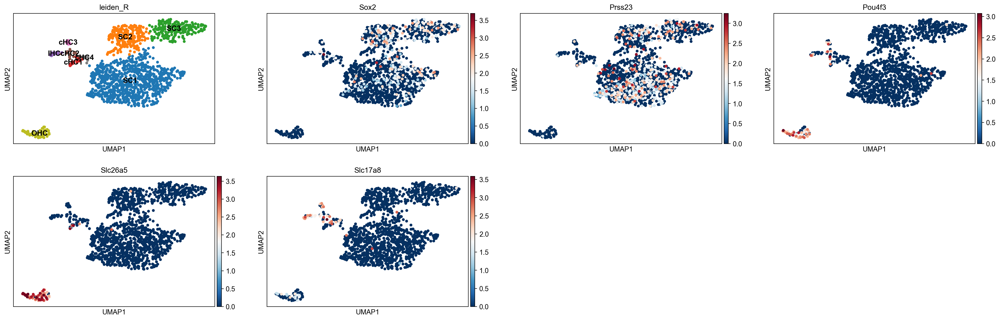

In [41]:
sc.tl.umap(adata_subset, init_pos='paga')
sc.pl.umap(adata_subset, color=['leiden_R', 'Sox2', 'Prss23', 'Pou4f3', 'Slc26a5', 'Slc17a8'], 
          legend_loc='on data')

--> added 'pos', the PAGA positions (adata.uns['paga'])


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\networkx\conve

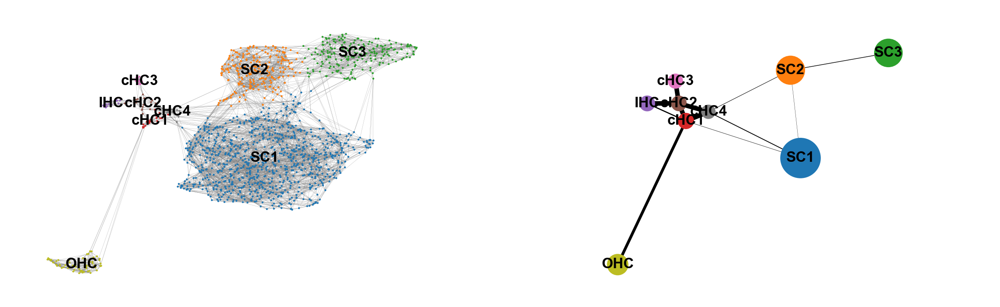

In [42]:
sc.pl.paga_compare(
    adata_subset, threshold=0.03, title='', right_margin=0.2, size=10, edge_width_scale=0.5,
    legend_fontsize=12, fontsize=12, frameon=False, edges=True, save=True)

In [43]:
#determine diffusion pseudotime
root_cell = np.flatnonzero(adata_subset.obs['leiden_R']  == 'SC3')[0]
adata_subset.uns['iroot'] = root_cell

In [44]:
sc.tl.dpt(adata_subset)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished
    eigenvalues of transition matrix
    [1.         0.996759   0.991308   0.99037015 0.97792745 0.9776587
     0.9540515  0.94830585 0.93636805 0.934336   0.92945725 0.92109704
     0.9128794  0.90378904 0.90008914]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


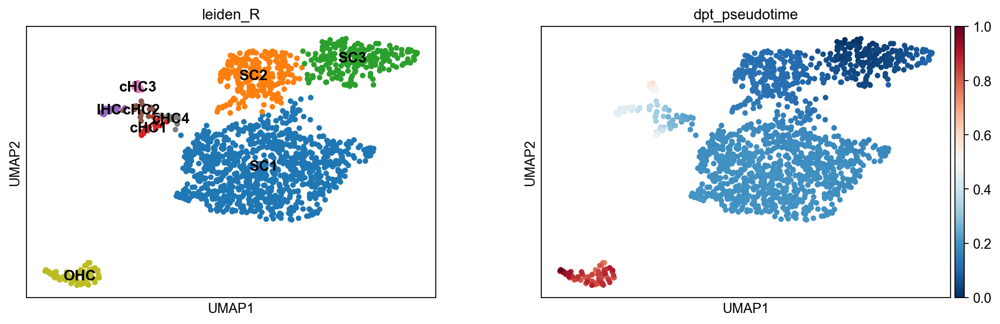

In [45]:
sc.pl.umap(adata_subset, color=['leiden_R', 'dpt_pseudotime'], legend_loc='on data')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


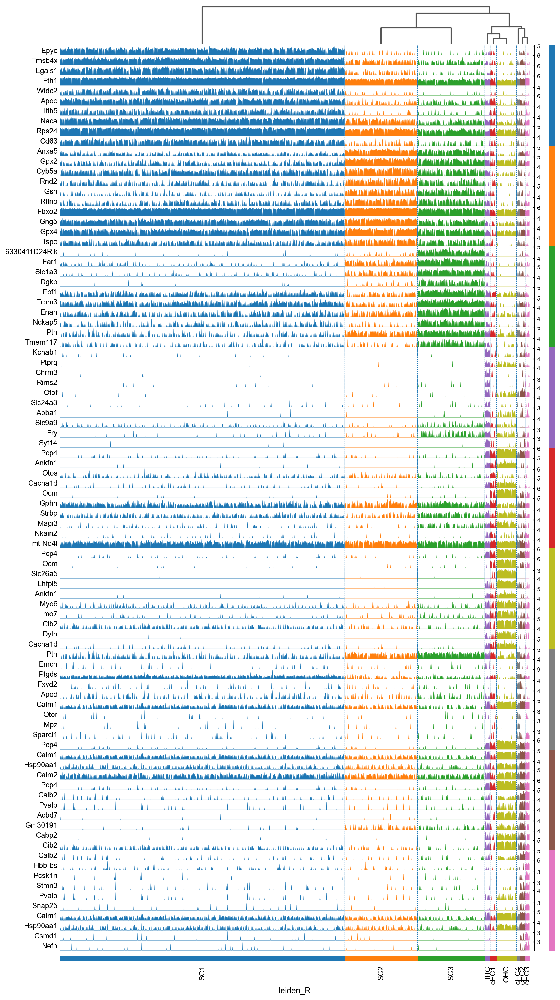

In [46]:
#Top 5 DEGS
sc.tl.rank_genes_groups(adata_subset, groupby='leiden_R', method='wilcoxon')
sc.pl.rank_genes_groups_tracksplot(adata_subset, n_genes=10, groupby = 'leiden_R', 
                                    values_to_plot='logfoldchanges', rotation = 90)

In [47]:
scv.pp.moments(adata_subset, n_pcs=30, n_neighbors=30)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [48]:
scv.tl.recover_dynamics(adata_subset, n_jobs=8)

recovering dynamics (using 8/12 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:00:05) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scvelo\tools\dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scvelo\tools\dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [49]:
scv.tl.velocity(adata_subset, mode="dynamical")
scv.tl.velocity_graph(adata_subset)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scvelo\core\_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


In [50]:
from cellrank.kernels import VelocityKernel
vk = VelocityKernel(adata_subset)
vk.compute_transition_matrix()

100%|██████████████████████████████████████████████████████████████████████████| 1455/1455 [00:00<00:00, 4428.12cell/s]


<VelocityKernel>

In [51]:
print(vk)

<VelocityKernel[softmax_scale=2.58, mode=deterministic, seed=53506, scheme=<CorrelationScheme>]>


In [52]:
from cellrank.kernels import PseudotimeKernel
pk = PseudotimeKernel(adata_subset, time_key='dpt_pseudotime')
print(pk)

<PseudotimeKernel>


In [53]:
pk.compute_transition_matrix()

100%|██████████████████████████████████████████████████████████████████████████| 1455/1455 [00:00<00:00, 3471.53cell/s]
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\cellrank\tl\_utils.py:719: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  G = nx.from_scipy_sparse_matrix(c) if issparse(c) else nx.from_numpy_array(c)


<PseudotimeKernel>

In [54]:
from cellrank.kernels import ConnectivityKernel
ck = ConnectivityKernel(adata_subset).compute_transition_matrix()
print(ck)

<ConnectivityKernel[dnorm=True, key=connectivities]>


In [55]:
combined_kernel = 0.5 * vk + 0.3 * pk + 0.2 * ck

In [56]:
print(combined_kernel)

((0.5 * <VelocityKernel[softmax_scale=2.58, mode=deterministic, seed=53506, scheme=<CorrelationScheme>]>) + (0.3 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>) + (0.2 * <ConnectivityKernel[dnorm=True, key=connectivities]>))


In [57]:
combined_kernel.compute_transition_matrix()
combined_kernel.compute_projection(basis="umap")

AttributeError: property 'categories' of 'Categorical' object has no setter

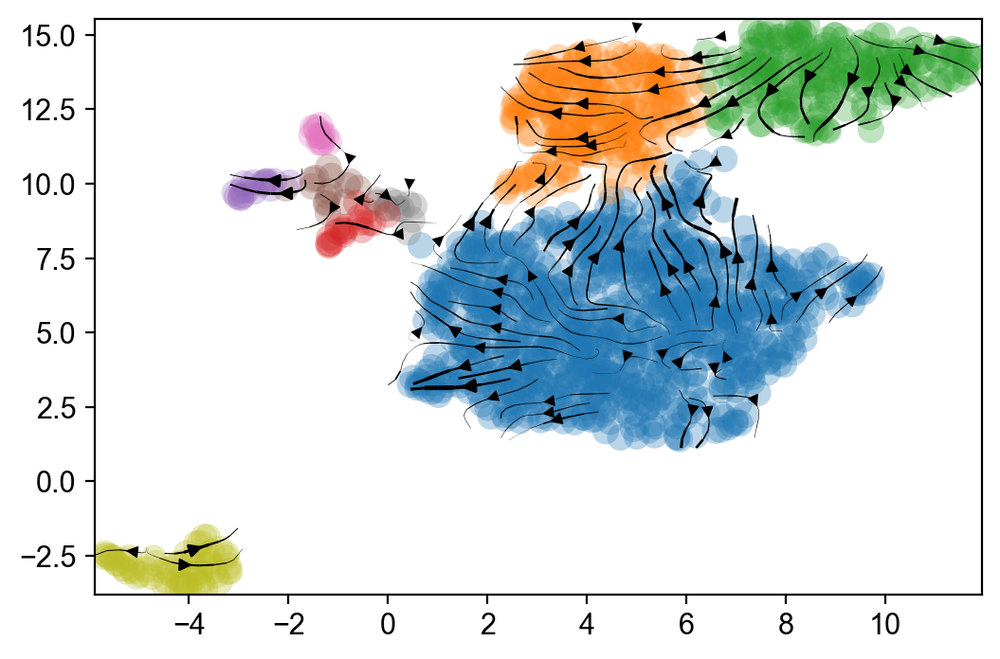

In [58]:
scv.pl.velocity_embedding_stream(adata_subset, vkey="T_fwd", basis="umap", color='leiden_R')

AttributeError: property 'categories' of 'Categorical' object has no setter

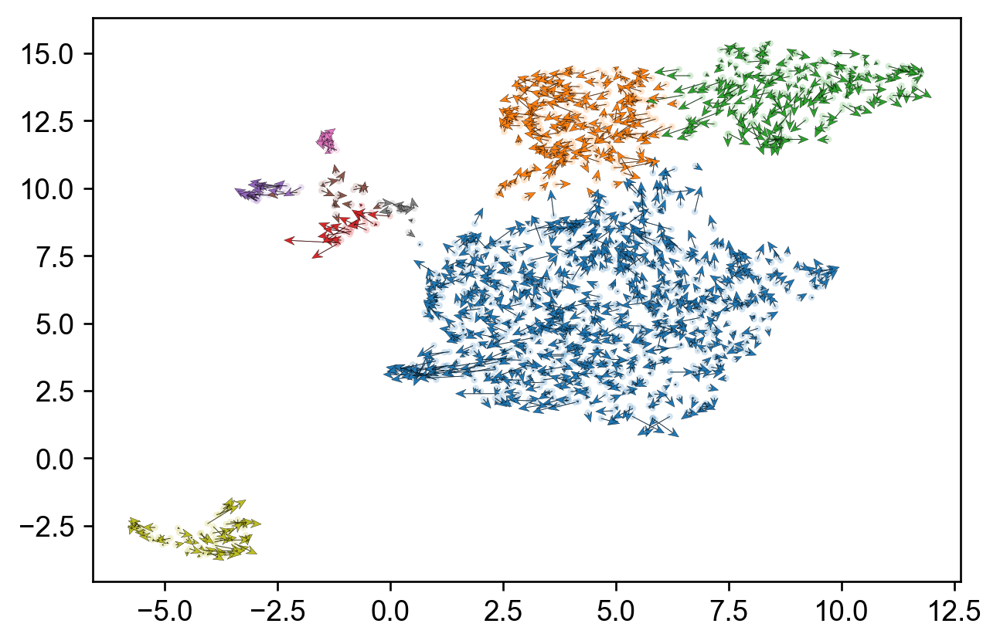

In [59]:
scv.pl.velocity_embedding(adata_subset, color='leiden_R', vkey="T_fwd", arrow_length=3, arrow_size=2, dpi=120)

In [60]:
scv.tl.velocity_graph(adata_subset, vkey="T_fwd")
scv.tl.latent_time(adata_subset, vkey="T_fwd")

computing velocities
    finished (0:00:00) --> added 
    'T_fwd', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scvelo\core\_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:00) --> added 
    'T_fwd_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


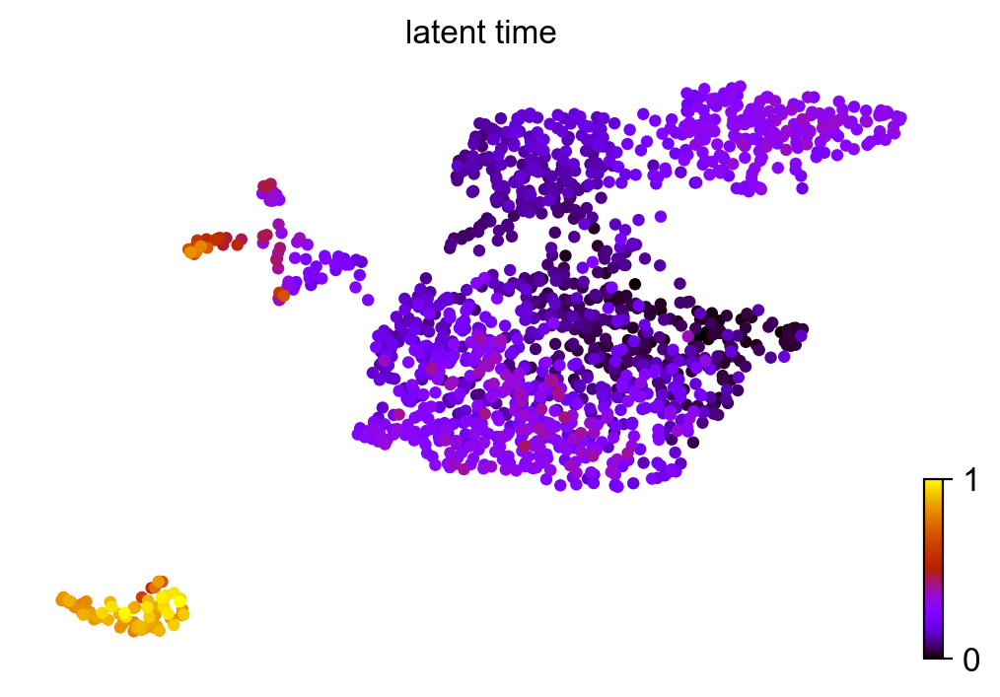

In [61]:
scv.pl.scatter(adata_subset, color='latent_time', color_map='gnuplot', size=80)

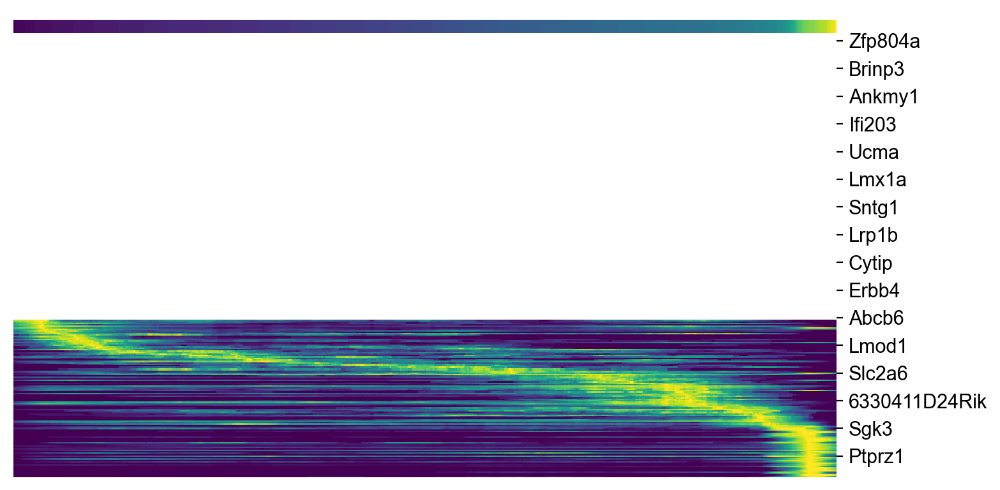

In [62]:
top_genes = adata_subset.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata_subset, var_names=top_genes, sortby='latent_time', col_color='latent_time', n_convolve=100)

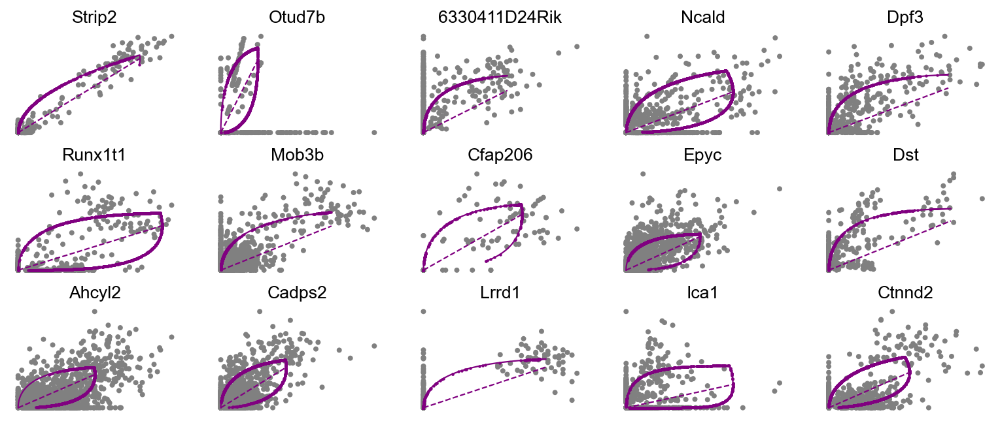

In [75]:
top_genes1 = adata_subset.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata_subset, basis=top_genes1[:15], ncols=5, frameon=False)

In [64]:
scv.tl.rank_velocity_genes(adata_subset, groupby='leiden_R', min_corr=.3)

df = scv.DataFrame(adata_subset.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scvelo\tools\utils.py:501: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


C:\Users\rvi33352\AppData\Local\Temp\ipykernel_2600\3357040007.py:3: DeprecationWarning: `scvelo.read_load.get_df` is deprecated since scVelo v0.2.4 and will be removed in a future version. Please use `scvelo.core.get_df` instead.
  df = scv.DataFrame(adata_subset.uns['rank_velocity_genes']['names'])


,SC1,SC2,SC3,cHC1,IHC,cHC2,cHC3,cHC4,OHC
0,Susd1,Plekha4,Dpf3,Otogl,Lrrd1,Apba1,Apba1,Apba1,Apba1
1,Mob3b,Dync1i1,Kcnq3,Apba1,Dst,Otogl,Otogl,Otogl,Dst
2,Ptprz1,Kcnq3,Luzp2,Dst,Apba1,Dst,Dst,Dst,Otogl
3,Epyc,Cadps2,Strip2,Mob3b,Mob3b,Lrrd1,Lrrd1,Ptprz1,Runx1t1
4,Runx1t1,Ptprz1,Dync1i1,Lrrd1,Strip2,Mob3b,Ptprz1,Epyc,Mob3b


In [65]:
from cellrank.tl.estimators import GPCCA

g = GPCCA(combined_kernel)
print(g)

GPCCA[n=1455, kernel=((0.5 * <VelocityKernel[softmax_scale=2.58, mode=deterministic, seed=53506, scheme=<CorrelationScheme>]>) + (0.3 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>) + (0.2 * <ConnectivityKernel[dnorm=True, key=connectivities]>))]


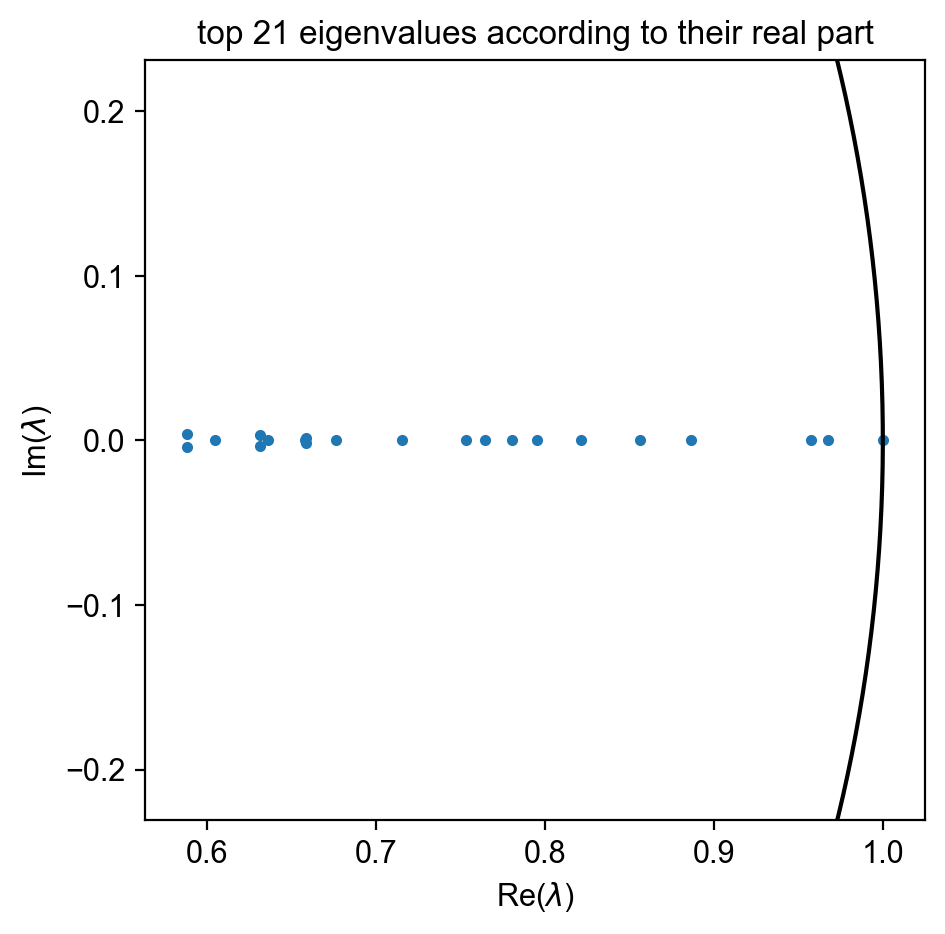

In [66]:
g.compute_schur(n_components=20)
g.plot_spectrum()

In [70]:
g.compute_macrostates(n_states=3, cluster_key="leiden_R")
g.plot_macrostates()

AttributeError: property 'categories' of 'Categorical' object has no setter

In [68]:
adata_subset.obs

,sample_batch,initial_size_unspliced,initial_size_spliced,initial_size,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,leiden_R,dpt_pseudotime,n_counts,velocity_self_transition,T_fwd_self_transition,root_cells,end_points,T_fwd_pseudotime,latent_time,latent_time_categorical
AAACCCAAGGCC,ACCT-1,216,51,51.0,763,763,1083.0,53.0,4.893814,1,SC2,0.118209,-223.389633,0.110723,0.039792,0.0,0.105904,0.467524,0.076305,0.08
AAACCCATCACT-1,TTGT-1,272,76,76.0,1459,1459,3282.0,112.0,3.412553,1,SC2,0.124464,-194.163422,0.158517,0.253587,0.0,0.100654,0.449940,0.112402,0.11
AAACGCTAGTCT,AACC-1,591,116,116.0,1548,1548,2962.0,78.0,2.633356,2,SC3,0.000000,-31.929306,0.386112,0.294630,0.0,0.019521,0.448641,0.277474,0.28
AAACGCTGTCAT,GACT-1,1051,203,203.0,2156,2156,6807.0,105.0,1.542530,0,SC1,0.204264,-272.076477,0.065023,0.242386,0.0,0.543508,0.752259,0.319879,0.32
AAACGCTGTCCC,ACGA-1,284,47,47.0,785,785,1076.0,39.0,3.624535,0,SC1,0.136704,-64.385315,0.055395,0.260901,0.0,0.146045,0.427477,0.099565,0.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGAGGGC-1,AGGA-1,178,40,40.0,1889,1889,5363.0,135.0,2.517248,0,SC1,0.206024,-223.830536,0.018922,0.349779,0.0,0.598602,0.761479,0.228492,0.23
TTTGGAGTCCTG,GGAC-1,847,163,163.0,2007,2007,4907.0,95.0,1.936010,0,SC1,0.193428,-179.978973,0.038068,0.271044,0.0,0.233059,0.507442,0.135992,0.14
TTTGGTTAGAAG,CCTG-1,206,35,35.0,566,566,901.0,37.0,4.106548,0,SC1,0.194297,-257.655884,0.037497,0.180884,0.0,0.569356,0.768285,0.281089,0.28
TTTGGTTAGGTT,CTTG-1,163,26,26.0,485,485,758.0,20.0,2.638522,0,SC1,0.196582,-205.387329,0.049039,0.145217,0.0,0.627258,0.792426,0.298064,0.30


In [73]:
cr.pl.circular_projection(adata_subset, keys="leiden_R", legend_loc="right")

KeyError: "Lineages key `'to_terminal_states'` not found in `adata.obsm`."